In [ ]:
import warnings
import glob
import os
import random
import numpy as np
import matplotlib.cm as cm
import matplotlib.pyplot as plt

from tqdm import tqdm
from utils.model_fitting import sigmoid,sigmoid_fun,slope_log,fit_sigmoid
from utils.plots import *
from biophysical_model.dopamine_toolbox import initialize_config_drugs
from utils.path import PathConfig,FigureWithData


warnings.filterwarnings("ignore")
rseed =10
np.random.seed(rseed)
random.seed(rseed)
fig_dir = os.path.join('figures', 'figure_S7_8')
data_fig_dir = os.path.join('data', 'source_data', 'figure_S7_8')
os.makedirs(fig_dir, exist_ok=True)
os.makedirs(data_fig_dir, exist_ok=True)




- `res['da']`       : DA concentrarion (Size: N Drug, N DA, N efficacy D2l, N efficacy D2s,N Timestamps)
- `res['d1_occ']`   : D1 occupancy (Size: N Drug, N DA, N efficacy D2l, N efficacy D2s,N Timestamps)
- `res['d2l_occ']`  : D2l occupancy(Size: N Drug, N DA, N efficacy D2l, N efficacy D2s,N Timestamps, N agonists)
- `res['d2s_occ']`  : D2s occupancy(Size: N Drug, N DA, N efficacy D2l, N efficacy D2s,N Timestamps, N agonists)
- `res['d1_act']`   : D1 activation (Size: N Drug, N DA, N efficacy D2l, N efficacy D2s,N Timestamps)
- `res['d2l_act']`  : D2l activation (Size: N Drug, N DA, N efficacy D2l, N efficacy D2s,N Timestamps, N agonists)
- `res['d2s_act']`  :  D2s activation (Size: N Drug, N DA, N efficacy D2l, N efficacy D2s,N Timestamps, N agonists)

Where: 
- N Drug:  number of drug concentrations tested 
- N DA : number of dopamine baseline levels (derived from baseline firing rates from single neurons)
- N efficacy D2l: number of D2l receptor efficacies 
- N efficacy D2s: number of D2s receptor efficacies 
- N Timestamps : NUmber of timestamps per trial 

## Reproduction of drug manipulations

- This code plots the results from the biophysical simulations performed by adding an additional D2 receptor agonist (bromocriptine)
- The simulations were done to reproduce the effects of bromocriptine on reversal learning in the study from Cools et al, 2009 in which healthy humans were given this drug and asked to perform a reversal task
- The files of the simnulations are dictionaries, containing:
    - `res['da']`       : DA concentrarion (Size: N Drug, N DA, N efficacy D2l, N efficacy D2s,N Timestamps)
    - `res['d1_occ']`   : D1 occupancy (Size: N Drug, N DA, N efficacy D2l, N efficacy D2s,N Timestamps)
    - `res['d2l_occ']`  : D2l occupancy(Size: N Drug, N DA, N efficacy D2l, N efficacy D2s,N Timestamps, N agonists)
    - `res['d2s_occ']`  : D2s occupancy(Size: N Drug, N DA, N efficacy D2l, N efficacy D2s,N Timestamps, N agonists)
    - `res['d1_act']`   : D1 activation (Size: N Drug, N DA, N efficacy D2l, N efficacy D2s,N Timestamps)
    - `res['d2l_act']`  : D2l activation (Size: N Drug, N DA, N efficacy D2l, N efficacy D2s,N Timestamps, N agonists)
    - `res['d2s_act']`  :  D2s activation (Size: N Drug, N DA, N efficacy D2l, N efficacy D2s,N Timestamps, N agonists)

    Where: 
    - N Drug:  number of drug concentrations tested 
    - N DA : number of dopamine baseline levels (derived from inducing shifts in the baseline firing rates of single neurons)
    - N efficacy D2l: number of D2l receptor efficacies 
    - N efficacy D2s: number of D2s receptor efficacies 
    - N Timestamps : NUmber of timestamps per trial 


In [2]:
#%% Load single unit simulations
paths = PathConfig()
g_dir = paths.g2_dir
data_path = os.path.join(g_dir,'drug_experiments')
file_list = glob.glob(data_path + '/*_results_only_base.npy')
res_mats = []
for id_unit in tqdm(range(len(file_list))):
    print([file_list[id_unit],id_unit])
    res_mats.append(np.load(file_list[id_unit],allow_pickle=True).item())
drug_concv, efficacies, ndrug, neffs, id_bins_base,da_base,rec_base,log_delta,ec50_d1,ec50_d2,da_eta = initialize_config_drugs()
nunits = len(res_mats)
nda = res_mats[0]['da'].shape[1]
nda_base =len(da_base)
n_points = len(da_eta)
efficacies_p = np.ceil(efficacies*10)/10

  0%|          | 0/40 [00:00<?, ?it/s]

  2%|▎         | 1/40 [00:00<00:07,  5.55it/s]

['data/googledrive/drug_experiments/r_HeA_2013-03-23_15-18-34_TT7_1_results_only_base.npy', 0]
['data/googledrive/drug_experiments/r_HeJ_2013-06-19_13-51-02_TT1_1_results_only_base.npy', 1]


  5%|▌         | 2/40 [00:00<00:07,  5.08it/s]

['data/googledrive/drug_experiments/r_HeA_2013-03-22_15-38-57_TT8_1_results_only_base.npy', 2]


  8%|▊         | 3/40 [00:00<00:08,  4.22it/s]

['data/googledrive/drug_experiments/r_K_2012-07-23_13-18-38_TT4_2_results_only_base.npy', 3]


 10%|█         | 4/40 [00:01<00:10,  3.56it/s]

['data/googledrive/drug_experiments/r_I_2012-05-17_16-33-13_TT6_1_results_only_base.npy', 4]


 12%|█▎        | 5/40 [00:01<00:09,  3.74it/s]

['data/googledrive/drug_experiments/r_K_2012-08-07_13-32-52_TT1_1_results_only_base.npy', 5]


 15%|█▌        | 6/40 [00:01<00:08,  3.82it/s]

['data/googledrive/drug_experiments/r_HeO_2013-09-17_14-17-59_TT5_2_results_only_base.npy', 6]


 18%|█▊        | 7/40 [00:01<00:08,  3.87it/s]

['data/googledrive/drug_experiments/r_K_2012-08-11_09-57-32_TT2_1_results_only_base.npy', 7]


 20%|██        | 8/40 [00:02<00:08,  3.88it/s]

['data/googledrive/drug_experiments/r_HeJ_2013-06-27_14-44-51_TT7_1_results_only_base.npy', 8]


 22%|██▎       | 9/40 [00:02<00:07,  3.92it/s]

['data/googledrive/drug_experiments/r_HeJ_2013-06-23_15-51-55_TT1_3_results_only_base.npy', 9]


 25%|██▌       | 10/40 [00:02<00:07,  3.95it/s]

['data/googledrive/drug_experiments/r_HeA_2013-03-18_18-34-09_TT7_1_results_only_base.npy', 10]


 28%|██▊       | 11/40 [00:02<00:07,  3.87it/s]

['data/googledrive/drug_experiments/r_HeA_2013-03-14_16-42-46_TT8_1_results_only_base.npy', 11]


 30%|███       | 12/40 [00:03<00:07,  3.82it/s]

['data/googledrive/drug_experiments/r_HeO_2013-09-12_09-59-03_TT1_1_results_only_base.npy', 12]


 32%|███▎      | 13/40 [00:03<00:06,  3.88it/s]

['data/googledrive/drug_experiments/r_HeO_2013-09-28_15-11-05_TT7_3_results_only_base.npy', 13]


 35%|███▌      | 14/40 [00:03<00:06,  3.91it/s]

['data/googledrive/drug_experiments/r_HeO_2013-09-22_14-31-43_TT5_1_results_only_base.npy', 14]


 38%|███▊      | 15/40 [00:03<00:06,  3.87it/s]

['data/googledrive/drug_experiments/r_H_2012-05-07_18-27-09_TT2_results_only_base.npy', 15]


 40%|████      | 16/40 [00:04<00:06,  3.82it/s]

['data/googledrive/drug_experiments/r_HeO_2013-09-16_12-58-06_TT1_1_results_only_base.npy', 16]


 42%|████▎     | 17/40 [00:04<00:06,  3.63it/s]

['data/googledrive/drug_experiments/r_HeO_2013-09-26_15-48-57_TT6_3_results_only_base.npy', 17]


 45%|████▌     | 18/40 [00:04<00:06,  3.45it/s]

['data/googledrive/drug_experiments/r_HeO_2013-09-08_12-13-21_TT7_2_results_only_base.npy', 18]


 48%|████▊     | 19/40 [00:05<00:09,  2.18it/s]

['data/googledrive/drug_experiments/r_K_2012-08-15_13-43-17_TT6_2_results_only_base.npy', 19]


 50%|█████     | 20/40 [00:08<00:23,  1.17s/it]

['data/googledrive/drug_experiments/r_H_2012-05-08_18-50-20_TT6_1_results_only_base.npy', 20]


 52%|█████▎    | 21/40 [00:08<00:17,  1.11it/s]

['data/googledrive/drug_experiments/r_K_2012-07-23_13-18-38_TT4_1_results_only_base.npy', 21]


 55%|█████▌    | 22/40 [00:08<00:12,  1.40it/s]

['data/googledrive/drug_experiments/r_K_2012-07-23_13-18-38_TT5_2_results_only_base.npy', 22]


 57%|█████▊    | 23/40 [00:09<00:09,  1.72it/s]

['data/googledrive/drug_experiments/r_HeA_2013-03-13_14-49-25_TT8_1_results_only_base.npy', 23]


 60%|██████    | 24/40 [00:09<00:07,  2.04it/s]

['data/googledrive/drug_experiments/r_H_2012-05-04_15-32-39_TT6_2_results_only_base.npy', 24]


 62%|██████▎   | 25/40 [00:09<00:06,  2.36it/s]

['data/googledrive/drug_experiments/r_HeO_2013-09-24_15-44-39_TT7_2_results_only_base.npy', 25]


 65%|██████▌   | 26/40 [00:10<00:05,  2.68it/s]

['data/googledrive/drug_experiments/r_G_2012-04-30_14-55-41_TT4_1_results_only_base.npy', 26]


 68%|██████▊   | 27/40 [00:10<00:04,  2.89it/s]

['data/googledrive/drug_experiments/r_HeA_2013-03-07_17-26-53_TT4_1_results_only_base.npy', 27]


 70%|███████   | 28/40 [00:10<00:03,  3.05it/s]

['data/googledrive/drug_experiments/r_HeA_2013-03-22_15-38-57_TT6_1_results_only_base.npy', 28]


 72%|███████▎  | 29/40 [00:10<00:03,  3.16it/s]

['data/googledrive/drug_experiments/r_HeO_2013-09-28_15-11-05_TT1_5_results_only_base.npy', 29]


 75%|███████▌  | 30/40 [00:11<00:03,  3.11it/s]

['data/googledrive/drug_experiments/r_HeA_2013-03-10_16-58-56_TT4_1_results_only_base.npy', 30]


 78%|███████▊  | 31/40 [00:11<00:03,  2.30it/s]

['data/googledrive/drug_experiments/r_HeO_2013-09-24_15-44-39_TT7_4_results_only_base.npy', 31]


 80%|████████  | 32/40 [00:13<00:06,  1.33it/s]

['data/googledrive/drug_experiments/r_HeO_2013-09-13_10-05-10_TT5_1_results_only_base.npy', 32]


 82%|████████▎ | 33/40 [00:13<00:04,  1.61it/s]

['data/googledrive/drug_experiments/r_HeO_2013-09-06_12-48-54_TT5_2_results_only_base.npy', 33]


 85%|████████▌ | 34/40 [00:14<00:04,  1.49it/s]

['data/googledrive/drug_experiments/r_K_2012-08-01_10-53-23_TT6_1_results_only_base.npy', 34]


 88%|████████▊ | 35/40 [00:17<00:06,  1.30s/it]

['data/googledrive/drug_experiments/r_HeO_2013-09-10_10-02-28_TT5_1_results_only_base.npy', 35]


 90%|█████████ | 36/40 [00:17<00:03,  1.00it/s]

['data/googledrive/drug_experiments/r_HeO_2013-09-25_15-40-51_TT8_2_results_only_base.npy', 36]


 92%|█████████▎| 37/40 [00:17<00:02,  1.29it/s]

['data/googledrive/drug_experiments/r_HeJ_2013-06-25_15-59-07_TT3_1_results_only_base.npy', 37]


 95%|█████████▌| 38/40 [00:18<00:01,  1.61it/s]

['data/googledrive/drug_experiments/r_HeA_2013-03-18_18-34-09_TT7_2_results_only_base.npy', 38]


 98%|█████████▊| 39/40 [00:18<00:00,  1.95it/s]

['data/googledrive/drug_experiments/r_K_2012-07-27_14-47-25_TT4_2_results_only_base.npy', 39]


100%|██████████| 40/40 [00:18<00:00,  2.15it/s]


### Dose-occupancy curve in the presence of bromocriptine
The following code fits a sigmoid function to compute the dose-occupancy curves of the D2 recptors in the presence of difference concentrations (color) and efficacies of the dopamine agonist bromocriptine 

In [3]:
#%% Fit sigmoid to the curves for d2 activation: 
ec50_act, bias_act = np.zeros((neffs,neffs,ndrug)), np.zeros((neffs,neffs,ndrug))
ec50_occ, bias_occ = np.zeros((neffs,neffs,ndrug)), np.zeros((neffs,neffs,ndrug))
popts_occ,popts_act = np.zeros((neffs,neffs,ndrug,4)), np.zeros((neffs,neffs,ndrug,4))
mus_da,mus_occ,mus_act =  np.zeros((neffs,neffs,ndrug,nda)),np.zeros((neffs,neffs,ndrug,nda)),np.zeros((neffs,neffs,ndrug,nda))
yfits_occ,yfits_act =  np.zeros((neffs,neffs,ndrug,nda_base)),np.zeros((neffs,neffs,ndrug,nda_base))

for i_eff_d2l in range(neffs):
    for i_eff_d2s in range(neffs):
        for idr,drug_conc in zip(range(ndrug),drug_concv):
            temp_act,temp_occ,temp_da = np.nan*np.ones((nda,nunits)),np.nan*np.ones((nda,nunits)),np.nan*np.ones((nda,nunits))
            for id_unit in range(nunits):
                temp_da[:,id_unit] = np.nanmean(res_mats[id_unit]['da'][0,:,i_eff_d2l,i_eff_d2s,id_bins_base],axis=0)
                temp_act[:,id_unit] = np.nanmean( res_mats[id_unit]['d2l_act'][idr,:,i_eff_d2l,i_eff_d2s,id_bins_base],axis=0)
                temp_occ[:,id_unit] = np.nanmean(np.sum(res_mats[id_unit]['d2l_occ'][idr,:,i_eff_d2l,i_eff_d2s,id_bins_base],axis=2),axis=0)   
            mu_act,mu_occ,mu_da = np.nanmean(temp_act,axis=1) ,np.nanmean(temp_occ,axis=1) ,np.nanmean(temp_da,axis=1) 
            mus_da[i_eff_d2l,i_eff_d2s,idr,:],mus_occ[i_eff_d2l,i_eff_d2s,idr,:],mus_act[i_eff_d2l,i_eff_d2s,idr,:] = mu_da,mu_occ,mu_act
            popt_occ, _,yfit_occ = fit_sigmoid(mu_da,mu_occ,da_base,log_xscale=True)
            popt_act, _,yfit_act = fit_sigmoid(mu_da,mu_act,da_base,log_xscale=True)
            yfits_occ[i_eff_d2l,i_eff_d2s,idr,:],yfits_act[i_eff_d2l,i_eff_d2s,idr,:] = yfit_occ,yfit_act
            bias_act[i_eff_d2l,i_eff_d2s,idr] = popt_act[-1]
            popts_act[i_eff_d2l,i_eff_d2s,idr,:] = popt_act
            bias_occ[i_eff_d2l,i_eff_d2s,idr] = popt_occ[-1]
            ec50_occ[i_eff_d2l,i_eff_d2s,idr] = popt_occ[1]
            popts_occ[i_eff_d2l,i_eff_d2s,idr,:] = popt_occ


###  Extended Data Figure 7

Plots of the dose-occupancy curves of the D2 recptors in the presence of difference concentrations (color) and efficacies of the dopamine agonist bromocriptine 

Saved figure to figures/figure_S7_8/figure_S7_sigmoid_occupancy.pdf
Saved data and stats to data/figure_data/figure_S7_8/figure_S7_sigmoid_occupancy.txt
Saved figure to figures/figure_S7_8/figure_S7_sigmoid_activation.pdf
Saved data and stats to data/figure_data/figure_S7_8/figure_S7_sigmoid_activation.txt


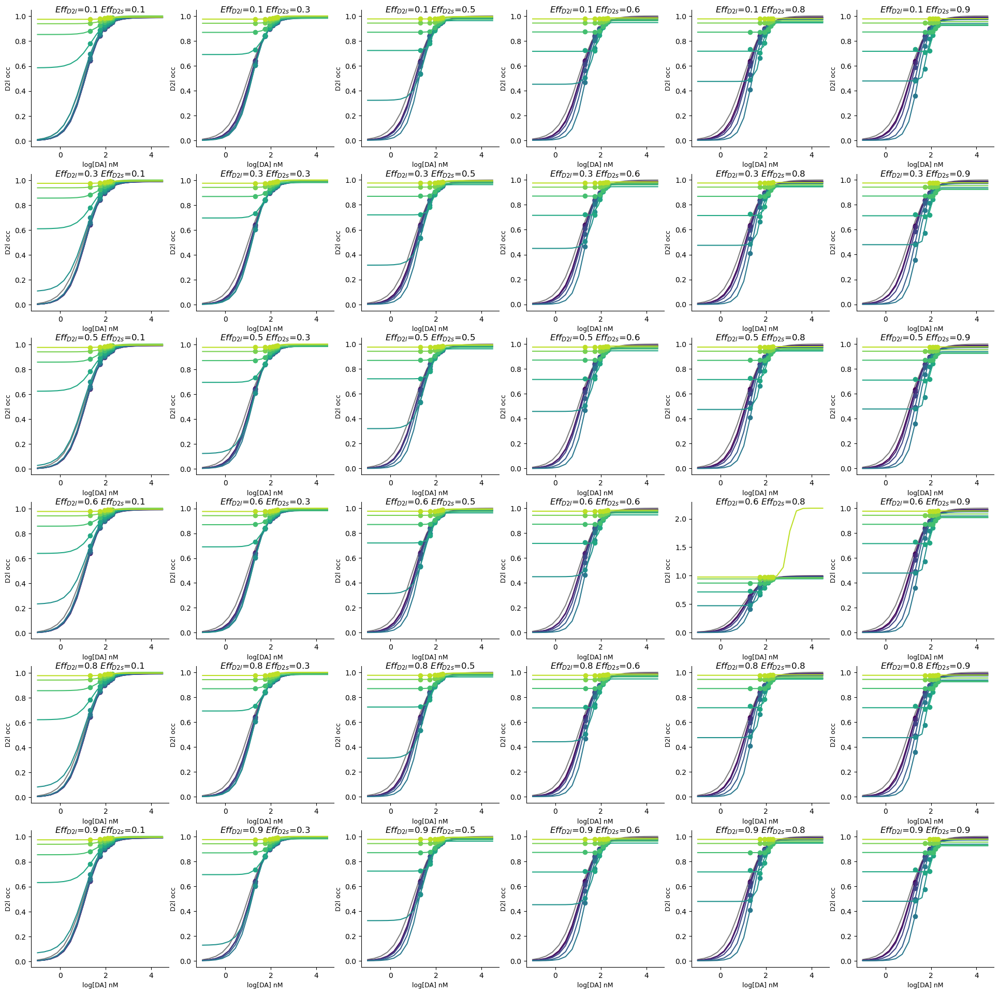

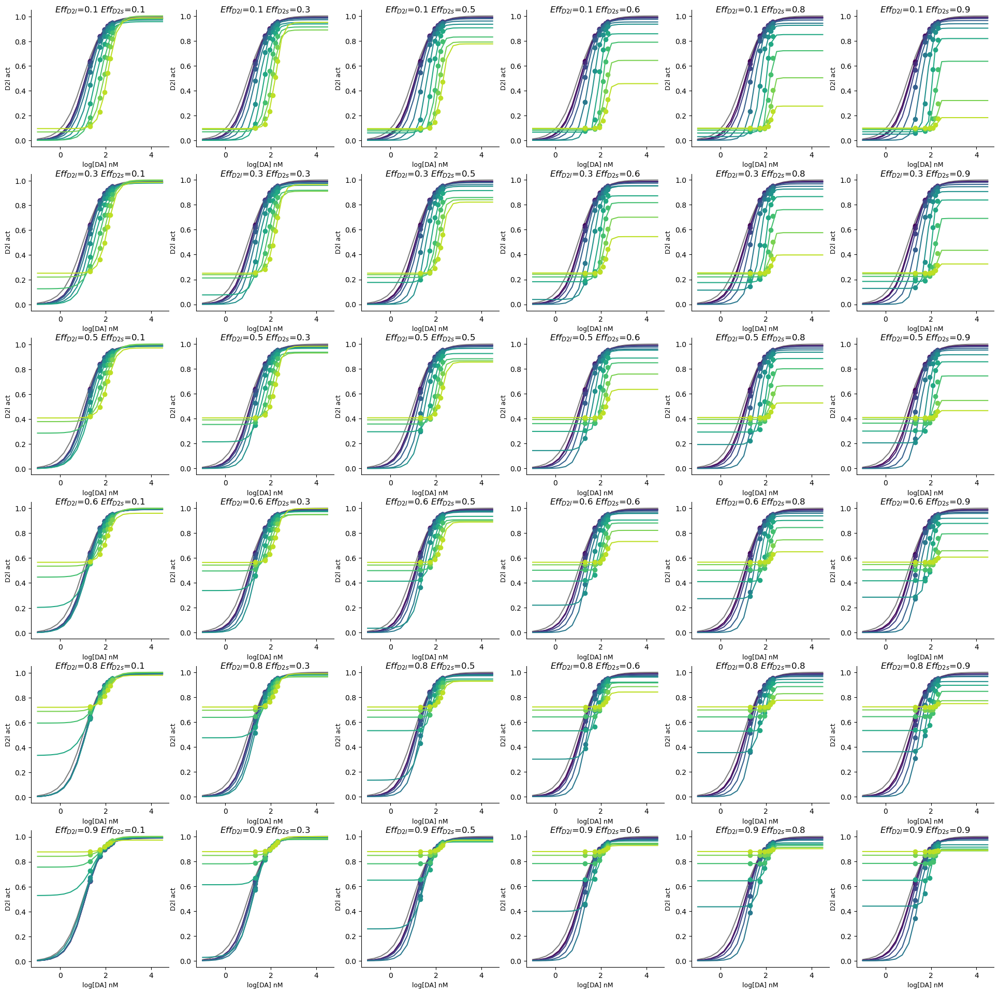

In [10]:
#%% Plot sigmoid to the curves for d2 activation: 
figo,axo = plt.subplots(neffs,neffs,figsize=(neffs*4,neffs*4))
figa,axa = plt.subplots(neffs,neffs,figsize=(neffs*4,neffs*4))

for i_eff_d2l in range(neffs):
    for i_eff_d2s in range(neffs):
        axo[i_eff_d2l,i_eff_d2s].plot(da_base,rec_base,color='grey')
        axa[i_eff_d2l,i_eff_d2s].plot(da_base,rec_base,color='grey')
        for idr,drug_conc in zip(range(ndrug),drug_concv):
            mu_da, mu_occ, mu_act = mus_da[i_eff_d2l,i_eff_d2s,idr,:],mus_occ[i_eff_d2l,i_eff_d2s,idr,:],mus_act[i_eff_d2l,i_eff_d2s,idr,:]
            yfit_occ, yfit_act = yfits_occ[i_eff_d2l,i_eff_d2s,idr,:],yfits_act[i_eff_d2l,i_eff_d2s,idr,:]
            axo[i_eff_d2l,i_eff_d2s].plot(np.log10(mu_da),mu_occ,'o',color=cm.viridis(idr/len(drug_concv)) )
            axo[i_eff_d2l,i_eff_d2s].plot(da_base,yfit_occ,color=cm.viridis(idr/len(drug_concv)) )
            axa[i_eff_d2l,i_eff_d2s].plot(np.log10(mu_da),mu_act,'o',color=cm.viridis(idr/len(drug_concv)) )
            axa[i_eff_d2l,i_eff_d2s].plot(da_base,yfit_act,color=cm.viridis(idr/len(drug_concv)) )
        plot_config(axo[i_eff_d2l,i_eff_d2s],'log[DA] nM','D2l occ',9,False)
        plot_config(axa[i_eff_d2l,i_eff_d2s],'log[DA] nM','D2l act',9,False)
        axo[i_eff_d2l,i_eff_d2s].set_title(r'$Eff_{D2l}$='+str(efficacies_p[i_eff_d2l])+r' $Eff_{D2s}$='+str(efficacies_p[i_eff_d2s]),y=.95)
        axa[i_eff_d2l,i_eff_d2s].set_title(r'$Eff_{D2l}$='+str(efficacies_p[i_eff_d2l])+r' $Eff_{D2s}$='+str(efficacies_p[i_eff_d2s]),y=.95)

# === Create the wrapper for both figures ===
fig_data_sigmoid_occ = FigureWithData(figo)   # for occupancy plots
fig_data_sigmoid_act = FigureWithData(figa)  # for activation plots

# === Save data for occupancy and activation ===
# (We'll loop through and save all panels neatly)

for i_eff_d2l in range(neffs):
    for i_eff_d2s in range(neffs):
        # Save Occupancy Data (panel from axo)
        panel_name_occ = f"occ_EffD2l_{efficacies_p[i_eff_d2l]}_EffD2s_{efficacies_p[i_eff_d2s]}"
        occ_data_list = []

        for idr, drug_conc in enumerate(drug_concv):
            mu_da = mus_da[i_eff_d2l, i_eff_d2s, idr, :]
            mu_occ = mus_occ[i_eff_d2l, i_eff_d2s, idr, :]
            yfit_occ = yfits_occ[i_eff_d2l, i_eff_d2s, idr, :]

            # stack: DA (log10), occupancy, 
            occ_data_list.append(
                np.column_stack((np.log10(mu_da), mu_occ))
            )

        occ_data_combined = np.vstack(occ_data_list)
        fig_data_sigmoid_occ.add_data(
            panel_name_occ,
            occ_data_combined,
            headers=['log10_DA_nM', 'D2R_Occupancy']
        )

        # Save Activation Data (panel from axa)
        panel_name_act = f"act_EffD2l_{efficacies_p[i_eff_d2l]}_EffD2s_{efficacies_p[i_eff_d2s]}"
        act_data_list = []

        for idr, drug_conc in enumerate(drug_concv):
            mu_da = mus_da[i_eff_d2l, i_eff_d2s, idr, :]
            mu_act = mus_act[i_eff_d2l, i_eff_d2s, idr, :]
            yfit_act = yfits_act[i_eff_d2l, i_eff_d2s, idr, :]

            # stack: DA (log10), activation, 
            act_data_list.append(
                np.column_stack((np.log10(mu_da), mu_act))
            )

        act_data_combined = np.vstack(act_data_list)
        fig_data_sigmoid_act.add_data(
            panel_name_act,
            act_data_combined,
            headers=['log10_DA_nM', 'D2R_Activation']
        )

# === Save everything ===
fig_data_sigmoid_occ.save(
    base_filename='figure_S7_sigmoid_occupancy',
    folder_data= data_fig_dir,
    folder_figures= fig_dir
)

fig_data_sigmoid_act.save(
    base_filename='figure_S7_sigmoid_activation',
    folder_data= data_fig_dir,
    folder_figures= fig_dir
)



In [7]:
(np.log10(mu_da).shape, mu_occ.shape, yfit_occ.shape)

((6,), (6,), (20,))

### Receptor sensitivities and asymmetric scaling factor in the presence of bromocriptine
The following code computes:
- Receptor sensitivities of D1 and D2 receptors (slopes of the dose-occupancy curve given a `log_delta` transient in dopamine )
- Asymmetric scaling factor $\tau$ given by the receptor sensitivities

The parameters were computed in the presence of difference concentrations and efficacies of the dopamine agonist bromocriptine , as well as for different levels of baseline dopamine concentration

In [9]:

d1_slope = np.zeros((neffs,neffs,ndrug+1,n_points))
d2_slope_act = np.zeros((neffs,neffs,ndrug+1,n_points))
eta_act = np.zeros((neffs,neffs,ndrug+1,n_points))
d2_slope_occ = np.zeros((neffs,neffs,ndrug+1,n_points))
eta_occ = np.zeros((neffs,neffs,ndrug+1,n_points))
for i_eff_d2l in range(neffs):
    for i_eff_d2s in range(neffs):
        for idr,idrug in enumerate(np.arange(-1,ndrug)):
            d1temp,d2temp_act,d2temp_occ =np.zeros(n_points),np.zeros(n_points),np.zeros(n_points)
            for id  in np.arange(n_points):
                if idrug>-1:
                    popt_act = popts_act[i_eff_d2l,i_eff_d2s,idrug,:]
                    popt_occ = popts_occ[i_eff_d2l,i_eff_d2s,idrug,:]
                    d2_slope_act[i_eff_d2l,i_eff_d2s,idr,id] = slope_log(da_eta[id],log_delta,popt_act,type_sigm ='full')
                    d2_slope_occ[i_eff_d2l,i_eff_d2s,idr,id] = slope_log(da_eta[id],log_delta,popt_occ,type_sigm ='full')
                else:
                    d2_slope_act[i_eff_d2l,i_eff_d2s,idr,id]  = slope_log(10**da_eta[id],1/3,ec50_d2,type_sigm ='simple')
                    d2_slope_occ[i_eff_d2l,i_eff_d2s,idr,id]  = slope_log(10**da_eta[id],1/3,ec50_d2,type_sigm ='simple')
                d1_slope[i_eff_d2l,i_eff_d2s,idr,id] = slope_log(10**da_eta[id],3,ec50_d1,type_sigm ='simple')
            eta_act[i_eff_d2l,i_eff_d2s,idr,:] = np.divide(d1_slope[i_eff_d2l,i_eff_d2s,idr,:],(d1_slope[i_eff_d2l,i_eff_d2s,idr,:]+d2_slope_act[i_eff_d2l,i_eff_d2s,idr,:]))
            eta_occ[i_eff_d2l,i_eff_d2s,idr,:] = np.divide(d1_slope[i_eff_d2l,i_eff_d2s,idr,:],(d1_slope[i_eff_d2l,i_eff_d2s,idr,:]+d2_slope_occ[i_eff_d2l,i_eff_d2s,idr,:]))

        drug_concp = np.concatenate([np.asarray([0]),drug_concv])

### Extended Data Figure 7

Plots of asymmetric scaling factor $\tau$ given by the receptor sensitivities


Saved figure to figures/figure_S7_8/figure_S7_eta_occ_asymmetric_scaling.pdf
Saved data and stats to data/figure_data/figure_S7_8/figure_S7_eta_occ_asymmetric_scaling.txt
Saved figure to figures/figure_S7_8/figure_S7_eta_act_asymmetric_scaling.pdf
Saved data and stats to data/figure_data/figure_S7_8/figure_S7_eta_act_asymmetric_scaling.txt


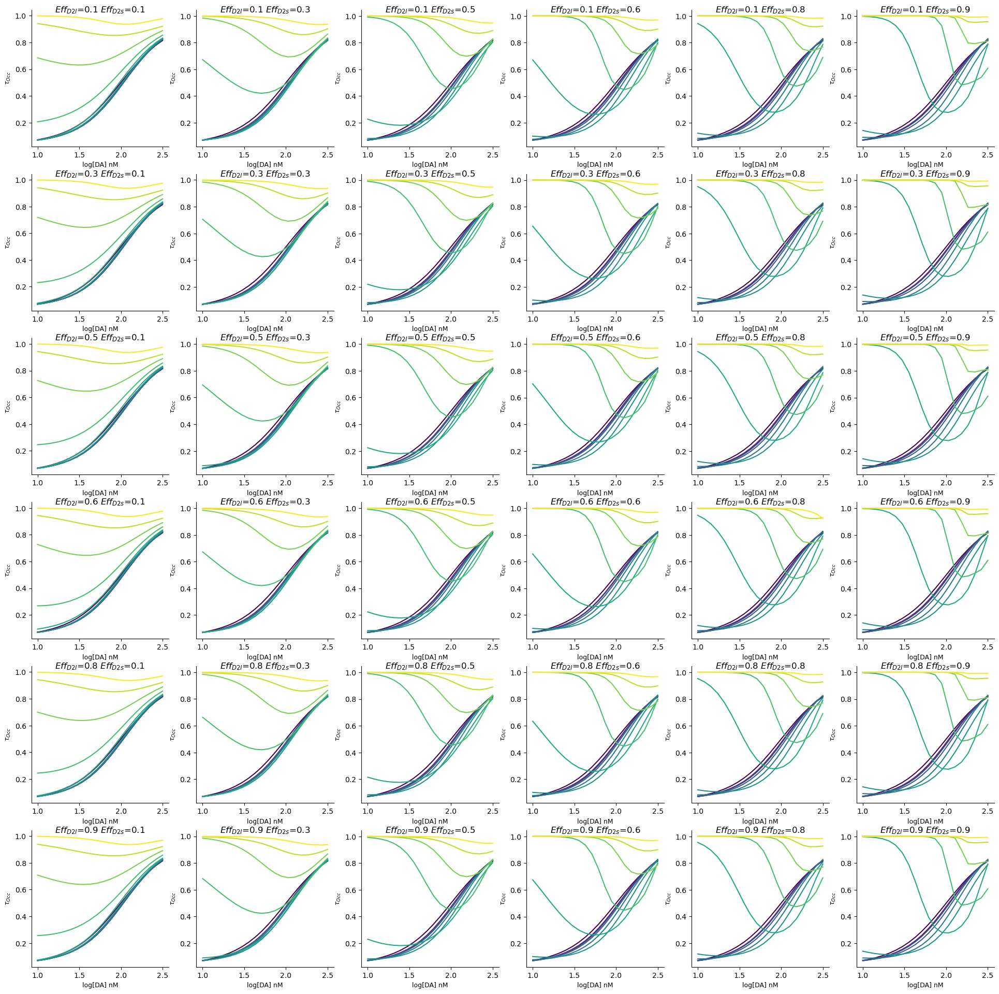

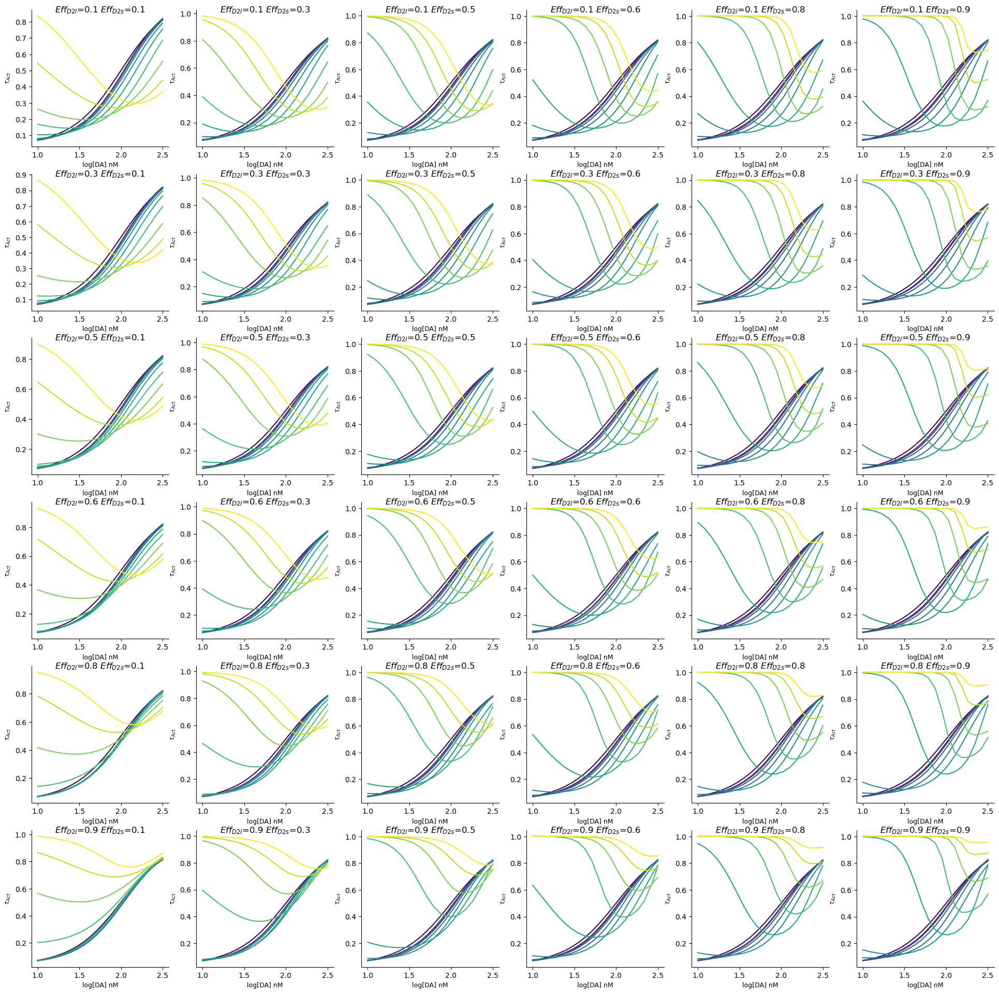

In [11]:
# Plot asymmetric scaling factors per efficiency:
figo,axo = plt.subplots(neffs,neffs,figsize=(neffs*4,neffs*4))
figa,axa = plt.subplots(neffs,neffs,figsize=(neffs*4,neffs*4))

for i_eff_d2l in range(neffs):
    for i_eff_d2s in range(neffs):
        for idrug in np.arange(ndrug+1):
            axo[i_eff_d2l,i_eff_d2s].plot(da_eta,eta_occ[i_eff_d2l,i_eff_d2s,idrug,:],color=cm.viridis(idrug/ndrug),
                label=str(np.ceil(drug_concp[idrug]*100)/100)+ ' nM')
            axa[i_eff_d2l,i_eff_d2s].plot(da_eta,eta_act[i_eff_d2l,i_eff_d2s,idrug,:],color=cm.viridis(idrug/ndrug),
                label=str(np.ceil(drug_concp[idrug]*100)/100)+ ' nM')
            axo[i_eff_d2l,i_eff_d2s].set_title(r'$Eff_{D2l}$='+str(efficacies_p[i_eff_d2l])+r' $Eff_{D2s}$='+str(efficacies_p[i_eff_d2s]),y=.95)
            axa[i_eff_d2l,i_eff_d2s].set_title(r'$Eff_{D2l}$='+str(efficacies_p[i_eff_d2l])+r' $Eff_{D2s}$='+str(efficacies_p[i_eff_d2s]),y=.95)
_=[plot_config(ia,'log[DA] nM',r'$\tau_{Occ}$',9,False) for ia in axo.flatten()]
_=[plot_config(ia,'log[DA] nM',r'$\tau_{Act}$',9,False) for ia in axa.flatten()]        

fig_data_occ = FigureWithData(figo)
# Reshape eta_occ to (n_conditions, len(da_eta))
eta_occ_flat = eta_occ.reshape(-1, eta_occ.shape[-1])
# Build headers: one column per point in da_eta
headers_occ = [f"logDA_{i}" for i in range(len(da_eta))]
fig_data_occ.add_data(
    "Asymmetric scaling factors (occupancy)", 
    eta_occ_flat, 
    headers_occ
)
fig_data_occ.save(
    base_filename='figure_S7_eta_occ_asymmetric_scaling',
    folder_data=data_fig_dir,
    folder_figures=fig_dir,
)

# --- Save activation asymmetric scaling figure ---
fig_data_act = FigureWithData(figa)
# Reshape eta_act similarly
eta_act_flat = eta_act.reshape(-1, eta_act.shape[-1])
headers_act = [f"logDA_{i}" for i in range(len(da_eta))]
fig_data_act.add_data(
    "Asymmetric scaling factors (activation)", 
    eta_act_flat, 
    headers_act
)
fig_data_act.save(
    base_filename='figure_S7_eta_act_asymmetric_scaling',
    folder_data=data_fig_dir,
    folder_figures=fig_dir,
)



###  Extended Data Figure 7

Plots of the equivalent to the  relative reversal learning parameter ( 2 $\tau$ -1) reported by Cools et al, 2009


Saved figure to figures/figure_S7_8/figure_eta_occ_rrl.pdf
Saved data and stats to data/figure_data/figure_S7_8/figure_eta_occ_rrl.txt
Saved figure to figures/figure_S7_8/figure_eta_act_rrl.pdf
Saved data and stats to data/figure_data/figure_S7_8/figure_eta_act_rrl.txt


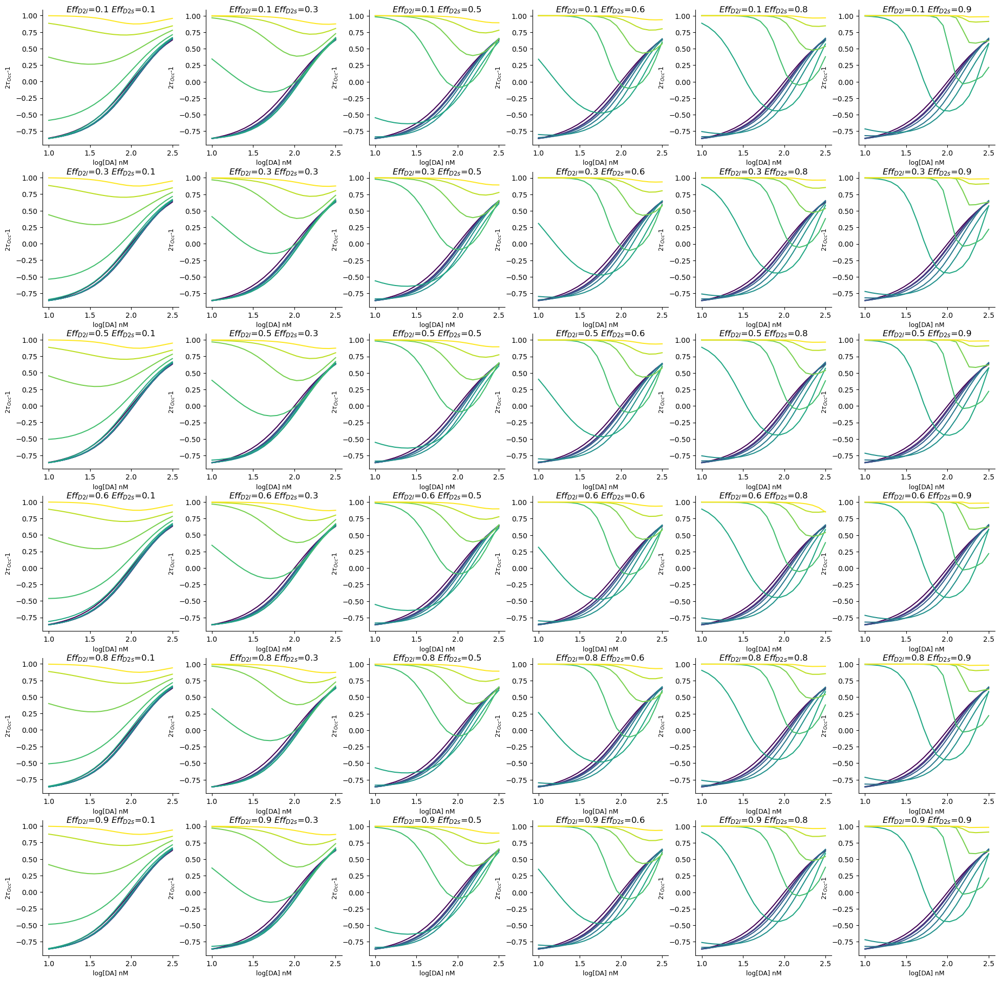

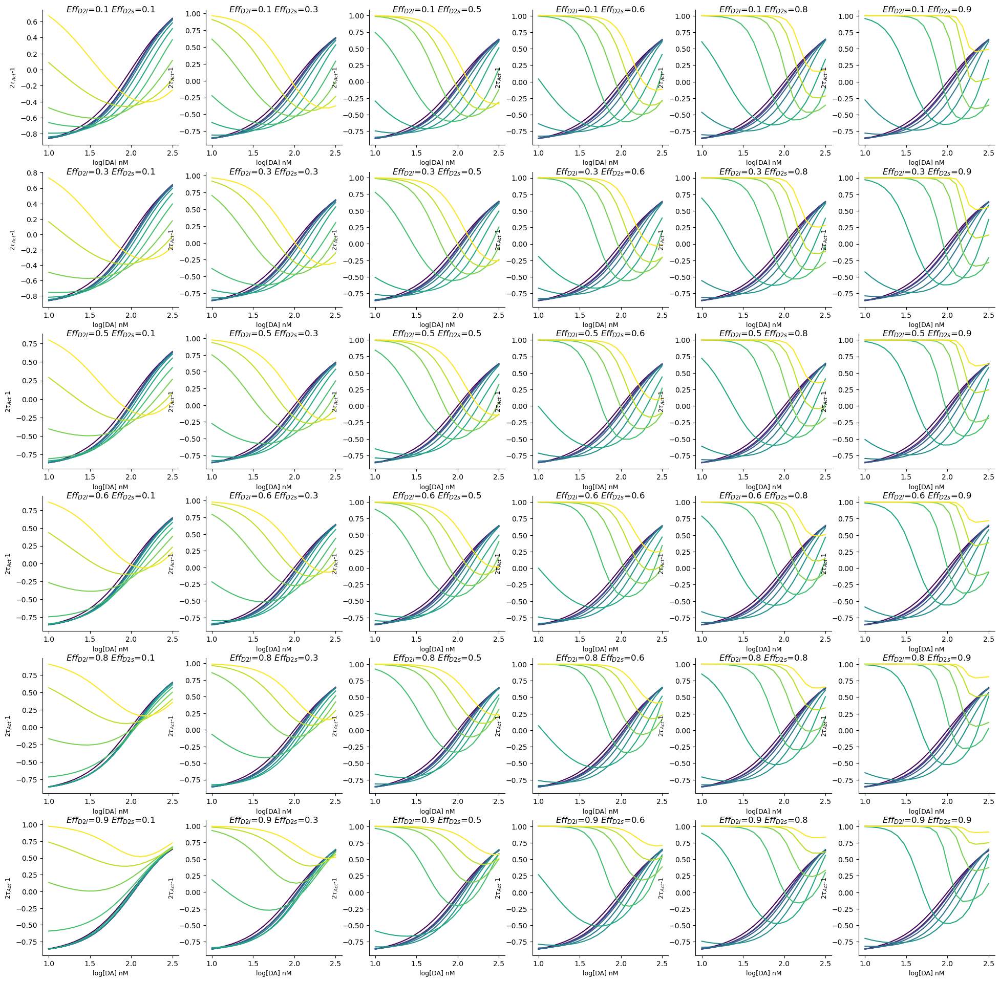

In [12]:
# Plot 2tau-1 per efficiency
figo,axo = plt.subplots(neffs,neffs,figsize=(neffs*4,neffs*4))
figa,axa = plt.subplots(neffs,neffs,figsize=(neffs*4,neffs*4))

for i_eff_d2l in range(neffs):
    for i_eff_d2s in range(neffs):
        for idrug in np.arange(ndrug+1):
            axo[i_eff_d2l,i_eff_d2s].plot(da_eta,2*eta_occ[i_eff_d2l,i_eff_d2s,idrug,:]-1,color=cm.viridis(idrug/ndrug),
                label=str(np.ceil(drug_concp[idrug]*100)/100)+ ' nM')
            axa[i_eff_d2l,i_eff_d2s].plot(da_eta,2*eta_act[i_eff_d2l,i_eff_d2s,idrug,:]-1,color=cm.viridis(idrug/ndrug),
                label=str(np.ceil(drug_concp[idrug]*100)/100)+ ' nM')
            axo[i_eff_d2l,i_eff_d2s].set_title(r'$Eff_{D2l}$='+str(efficacies_p[i_eff_d2l])+r' $Eff_{D2s}$='+str(efficacies_p[i_eff_d2s]),y=.95)
            axa[i_eff_d2l,i_eff_d2s].set_title(r'$Eff_{D2l}$='+str(efficacies_p[i_eff_d2l])+r' $Eff_{D2s}$='+str(efficacies_p[i_eff_d2s]),y=.95)
_=[plot_config(ia,'log[DA] nM',r'2$\tau_{Occ}$-1',9,False) for ia in axo.flatten()]
_=[plot_config(ia,'log[DA] nM',r'2$\tau_{Act}$-1',9,False) for ia in axa.flatten()]        

# --- Save occupancy asymmetric scaling figure ---
fig_data_occ = FigureWithData(figo)

# Reshape eta_occ to (n_conditions, len(da_eta))
eta_occ_flat = (2*eta_occ-1).reshape(-1, eta_occ.shape[-1])

# Build headers: one column per point in da_eta
headers_occ = [f"logDA_{i}" for i in range(len(da_eta))]

fig_data_occ.add_data(
    "RRL (occupancy)", 
    eta_occ_flat, 
    headers_occ
)

fig_data_occ.save(
    base_filename='figure_eta_occ_rrl',
    folder_data=data_fig_dir,
    folder_figures=fig_dir,
)

# --- Save activation asymmetric scaling figure ---
fig_data_act = FigureWithData(figa)

# Reshape eta_act similarly
eta_act_flat = (2*eta_act-1).reshape(-1, eta_act.shape[-1])

headers_act = [f"logDA_{i}" for i in range(len(da_eta))]

fig_data_act.add_data(
    "RRL (activation)", 
    eta_act_flat, 
    headers_act
)

fig_data_act.save(
    base_filename='figure_eta_act_rrl',
    folder_data=data_fig_dir,
    folder_figures=fig_dir,
)

### Extended Data Figure 8

Plots of the change in the relative reversal learning parameter ( 2 $\tau$ -1) reported by Cools et al, 2009

Saved figure to figures/figure_S7_8/figure_eta_occ_asymmetric_scaling_diff.pdf
Saved data and stats to data/figure_data/figure_S7_8/figure_eta_occ_asymmetric_scaling_diff.txt
Saved figure to figures/figure_S7_8/figure_eta_act_asymmetric_scaling_diff.pdf
Saved data and stats to data/figure_data/figure_S7_8/figure_eta_act_asymmetric_scaling_diff.txt


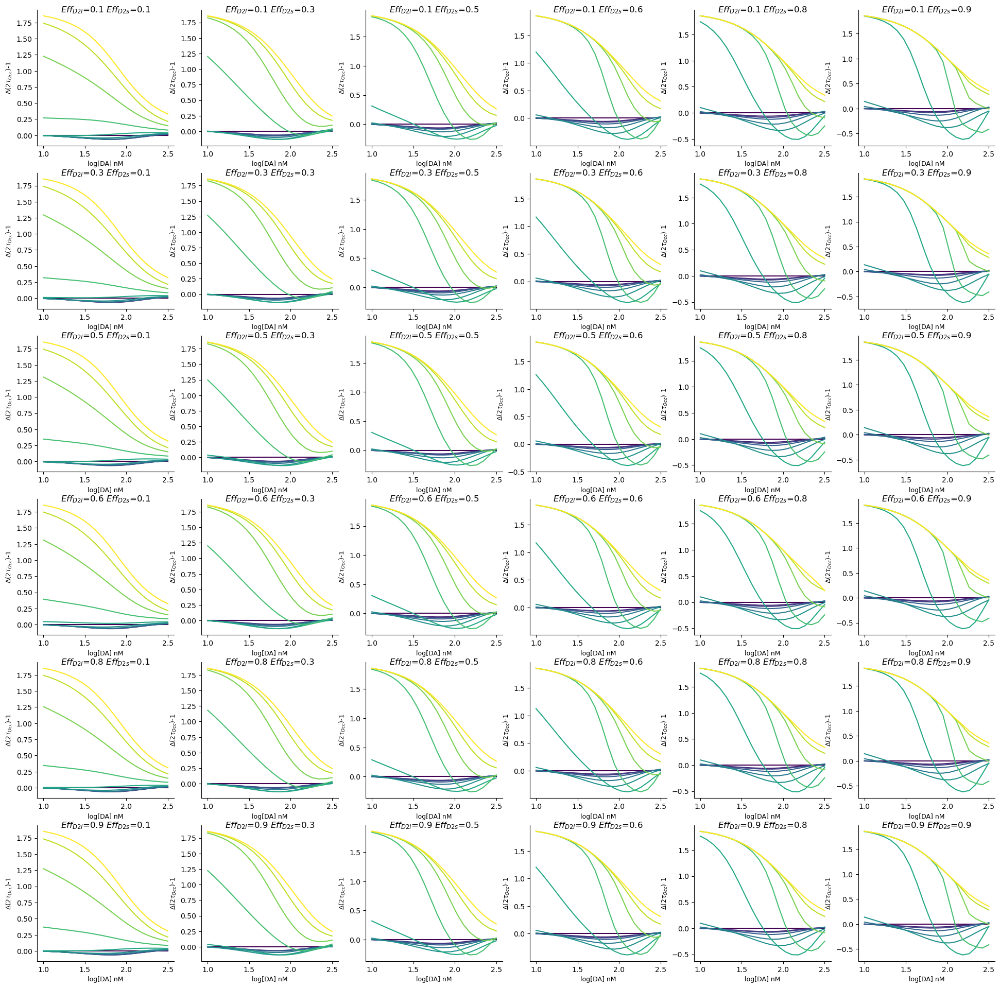

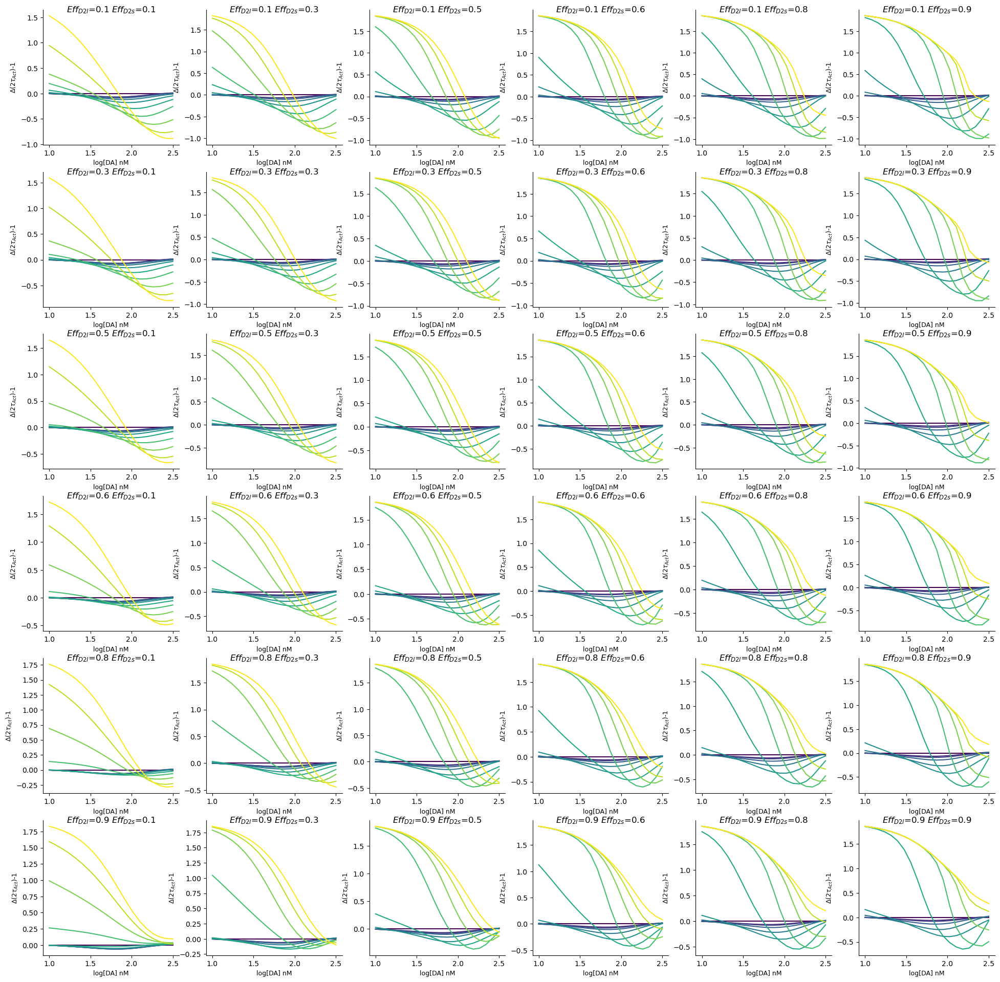

In [13]:
# Plot change in asymmetric scaling factors per efficiency:
figo,axo = plt.subplots(neffs,neffs,figsize=(neffs*4,neffs*4))
figa,axa = plt.subplots(neffs,neffs,figsize=(neffs*4,neffs*4))

for i_eff_d2l in range(neffs):
    for i_eff_d2s in range(neffs):
        for idrug in np.arange(ndrug+1):
            diff_o = (2*eta_occ[i_eff_d2l,i_eff_d2s,idrug,:]-1)-(2*eta_occ[i_eff_d2l,i_eff_d2s,0,:]-1)
            diff_a = (2*eta_act[i_eff_d2l,i_eff_d2s,idrug,:]-1)-(2*eta_act[i_eff_d2l,i_eff_d2s,0,:]-1)

            axo[i_eff_d2l,i_eff_d2s].plot(da_eta,diff_o,color=cm.viridis(idrug/ndrug),
                label=str(np.ceil(drug_concp[idrug]*100)/100)+ ' nM')
            axa[i_eff_d2l,i_eff_d2s].plot(da_eta,diff_a,color=cm.viridis(idrug/ndrug),
                label=str(np.ceil(drug_concp[idrug]*100)/100)+ ' nM')
            axo[i_eff_d2l,i_eff_d2s].set_title(r'$Eff_{D2l}$='+str(efficacies_p[i_eff_d2l])+r' $Eff_{D2s}$='+str(efficacies_p[i_eff_d2s]),y=.95)
            axa[i_eff_d2l,i_eff_d2s].set_title(r'$Eff_{D2l}$='+str(efficacies_p[i_eff_d2l])+r' $Eff_{D2s}$='+str(efficacies_p[i_eff_d2s]),y=.95)
_=[plot_config(ia,'log[DA] nM',r'$\Delta$(2$\tau_{Occ}$)-1',9,False) for ia in axo.flatten()]
_=[plot_config(ia,'log[DA] nM',r'$\Delta$(2$\tau_{Act}$)-1',9,False) for ia in axa.flatten()]  

# 1. Create FigureWithData wrappers
fig_data_diff_occ = FigureWithData(figo)  # figo: your occupancy difference figure
fig_data_diff_act = FigureWithData(figa)  # figa: your activation difference figure

# 2. Compute difference arrays
diff_eta_occ = (2 * eta_occ - 1) - (2 * eta_occ[:, :, 0:1, :] - 1)  # shape [neffs, neffs, ndrug+1, len(da_eta)]
diff_eta_act = (2 * eta_act - 1) - (2 * eta_act[:, :, 0:1, :] - 1)

# 3. Flatten for saving
diff_eta_occ_flat = diff_eta_occ.reshape(-1, diff_eta_occ.shape[-1])  # [n_conditions, len(da_eta)]
diff_eta_act_flat = diff_eta_act.reshape(-1, diff_eta_act.shape[-1])

# 4. Headers
headers_diff = [f"logDA_{i}" for i in range(len(da_eta))]

# 5. Add data
fig_data_diff_occ.add_data(
    "Difference asymmetric scaling (occupancy)", 
    diff_eta_occ_flat, 
    headers_diff
)

fig_data_diff_act.add_data(
    "Difference asymmetric scaling (activation)", 
    diff_eta_act_flat, 
    headers_diff
)

# 6. Save
fig_data_diff_occ.save(
    base_filename='figure_eta_occ_asymmetric_scaling_diff',
    folder_data=data_fig_dir,
    folder_figures=fig_dir,
)

fig_data_diff_act.save(
    base_filename='figure_eta_act_asymmetric_scaling_diff',
    folder_data=data_fig_dir,
    folder_figures=fig_dir,
)
